<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I2wUTT12p5bX3RCku_T_82aD4tkY9LVY" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов.

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?




In [1]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

# если по ссылке слишком много запросов, датасет можно скачать с kaggle: https://www.kaggle.com/datasets/kanametov/ph2dataset

--2023-12-04 17:46:38--  https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/8lqrloi0mxj2acu/PH2Dataset.rar [following]
--2023-12-04 17:46:38--  https://www.dropbox.com/s/raw/8lqrloi0mxj2acu/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 429 Too Many Requests
2023-12-04 17:46:39 ERROR 429: Too Many Requests.



Я загрузил зип файл с датасетом

In [2]:
import zipfile
import os

zip_path = 'archive.zip'  # Укажите путь к файлу архива
 # Укажите папку, куда нужно извлечь содержимое архива
extract_folder=''
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall()


In [3]:
!ls

archive.zip  PH2Dataset  sample_data


In [4]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [5]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2_Dataset')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [6]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [7]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [8]:
len(lesions)

200

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [10]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [11]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [12]:
from torch.utils.data import DataLoader
batch_size = 25
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [13]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

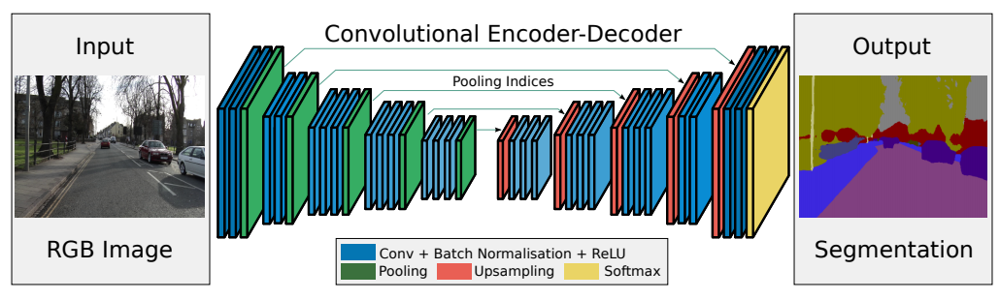

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [15]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True)
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 32 -> 16
        self.enc_conv4 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),
        )
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 16 -> 8

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 8 -> 16
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),
        )
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 16 -> 32
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True),
        )
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 32 -> 64
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),
        )
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 64 -> 128
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),
        )
        self.upsample4 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 128 -> 256
        self.dec_conv4 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, padding=1),
            # nn.BatchNorm2d(num_features=1),
            # nn.ReLU(inplace=True),
        )

    def forward(self, x):
        # encoder
        x = self.enc_conv0(x)
        x, inds0 = self.pool0(x)
        x = self.enc_conv1(x)
        x, inds1 = self.pool1(x)
        x = self.enc_conv2(x)
        x, inds2 = self.pool2(x)
        x = self.enc_conv3(x)
        x, inds3 = self.pool3(x)
        x = self.enc_conv4(x)
        x, inds4 = self.pool4(x)

        # decoder
        x = self.upsample0(x, inds4)
        x = self.dec_conv0(x)
        x = self.upsample1(x, inds3)
        x = self.dec_conv1(x)
        x = self.upsample2(x, inds2)
        x = self.dec_conv2(x)
        x = self.upsample3(x, inds1)
        x = self.dec_conv3(x)
        x = self.upsample4(x, inds0)
        x = self.dec_conv4(x)
        return x



In [16]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # print(f"{outputs.shape = }")
    # print(f"{labels.shape = }")
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    # print(f"{outputs = }")
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    # print(f"{labels = }")
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0

    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    # print(f"{thresholded.shape = }")
    return thresholded.mean().item()  #

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации.

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [17]:
def bce_loss(y_pred, y_real):
    return (y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))).mean()

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [18]:
from enum import Enum
from typing import Optional, Literal

from matplotlib import pyplot as plt
from torch import nn
from tqdm.notebook import tqdm, trange

class TrainType(Enum):
    TRAIN = "train"
    FULL = "full"

    def __str__(self):
        return self.value.lower()

MODEL_FILENAME_FMT = "{model_name}.{train_type}.{device_type}.tar"
MODEL_STORAGE_DIR = "./trained_models"
def save_model(model, optimizer, epoch, loss, model_name, path, lr_scheduler=None, metrics=None):
    state = {
        'model_name': model_name,
        'model_state': model.state_dict(),
        'optimizer_state': optimizer.state_dict(),
        'lr_scheduler_state': None if lr_scheduler is None else lr_scheduler.state_dict(),
        'epoch': epoch,
        'loss': loss,
        'metrics': metrics
    }
    directory = os.path.dirname(os.path.abspath(path))
    os.makedirs(directory, exist_ok=True)
    torch.save(state, path)

def load_model_state_and_info(model_name, train_type, device_type):
    path = os.path.join(
        MODEL_STORAGE_DIR,
        MODEL_FILENAME_FMT.format(
            model_name=model_name,
            train_type=train_type,
            device_type=device_type
        )
    )
    return torch.load(path)

def show_plots(train_loss, train_metrics, val_loss, val_metrics, model_name=""):
    plt.figure(figsize=(15, 9))
    plt.plot(np.arange(1, len(train_loss) + 1), train_loss, label="train_loss")
    plt.plot(np.arange(1, len(val_loss) + 1), val_loss, label="val_loss")
    best_epoch = np.argmin(val_loss) + 1
    plt.axvline(best_epoch, color='r', label="best epoch by loss")
    plt.legend(loc='best')
    plt.title(model_name)
    plt.xlabel("epochs")
    plt.ylabel("loss")
    plt.show()
    plt.figure(figsize=(15, 9))
    for name, values in train_metrics.items():
        plt.plot(np.arange(1, len(values) + 1), values, label="train_{}".format(name))
    for name, values in val_metrics.items():
        plt.plot(np.arange(1, len(values) + 1), values, label="val_{}".format(name))
        best_epoch = np.argmax(values) + 1
        plt.axvline(best_epoch, color='r', label="best epoch by {}".format(name))
    plt.legend(loc='best')
    plt.title(model_name)
    plt.xlabel("epoch")
    plt.ylabel("metric")
    plt.show()


def print_best_epoch(metric_values, metric_name='metric', type: Optional[Literal['max', 'min']]='max', model_name='model'):
    if type == 'max':
        func = np.argmax
    elif type == 'min':
        func == np.argmin
    else:
        raise ValueError("`type` must be 'min' or 'max'")

    epoch = func(metric_values)
    best_metric_value = metric_values[epoch]

    epoch += 1
    print("{}: best {} value {} on {} epoch.".format(model_name, metric_name, best_metric_value, epoch))

def multiclass_get_labels(output):
    return output.argmax(-1)

def one_class_get_labels(output):
    return torch.sigmoid(output) >= 0.5

def epoch_train_stage(model, data_loader, criterion, optimizer, device, model_output_to_predict):
    loss_sum = 0
    y_true = []
    y_pred = []
    was_training = model.training
    model.train()
    for data, labels in tqdm(data_loader, desc="train batches", leave=False):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()

        loss_sum += loss.item()
        pred = model_output_to_predict(output)
        y_true.append(labels)
        y_pred.append(pred)
    with torch.no_grad():
        y_true = torch.cat(y_true)
        y_pred = torch.cat(y_pred)
    model.train(was_training)
    return loss_sum / len(data_loader), y_pred, y_true


def epoch_val_stage(model, data_loader, criterion, device, model_output_to_predict):
    loss_sum = 0
    y_true = []
    y_pred = []
    was_training = model.training
    model.eval()
    with torch.no_grad():
        for data, labels in tqdm(data_loader, desc="val batches", leave=False):
            data, labels = data.to(device), labels.to(device)
            output = model(data)
            loss = criterion(output, labels)

            loss_sum += loss.item()
            pred = model_output_to_predict(output)
            y_true.append(labels)
            y_pred.append(pred)

        y_true = torch.cat(y_true)
        y_pred = torch.cat(y_pred)

    model.train(was_training)
    return loss_sum / len(data_loader), y_pred, y_true


def train_model(
        model, train_loader, val_loader, criterion, optimizer, epochs, device, model_output_to_predict,
        metrics, main_metric_name=None, save_best=False, model_name=None, logs_dir=MODEL_STORAGE_DIR,
        lr_scheduler=None, print_samples_callback=None):
    if model_name is None:
        model_name = model.__class__.__name__
    if not isinstance(metrics, dict):
        metrics = {metric.__name__: metric for metric in metrics}
    if save_best and main_metric_name is None:
        raise ValueError("You should set `main_metric_name` when `save_best` is True")
    if main_metric_name not in metrics:
        raise ValueError("`main_metric_name` \"{}\" not found in `metrics`".format(main_metric_name))

    train_losses = []
    train_metrics = {name: [] for name in metrics}
    val_losses = []
    val_metrics = {name: [] for name in metrics}
    best_epoch = -1
    history = [
        train_losses,
        train_metrics,
        val_losses,
        val_metrics,
    ]
    model = model.to(device)
    best_metric_value = None
    with trange(1, epochs + 1, desc="epochs") as pbar:
        for i in pbar:
            train_loss, *train_ypt = epoch_train_stage(model, train_loader, criterion, optimizer, device, model_output_to_predict)
            train_losses.append(train_loss)
            for name, metric in metrics.items():
                train_metrics[name].append(metric(*train_ypt))
            val_loss, *val_ypt = epoch_val_stage(model, val_loader, criterion, device, model_output_to_predict)
            if lr_scheduler is not None:
                lr_scheduler.step()
            val_losses.append(val_loss)
            for name, metric in metrics.items():
                val_metrics[name].append(metric(*val_ypt))

            pbar.set_postfix(
                t_loss=train_loss, v_loss=val_loss,
                **{"t_" + name: value_list[-1] for name, value_list in train_metrics.items()},
                **{"v_" + name: value_list[-1] for name, value_list in val_metrics.items()})
            if print_samples_callback is not None:
                print_samples_callback(model)
    return history

def refit(
        model, data_loader, criterion, optimizer, epochs, device,
        metrics, main_metric_name=None, save_best=False, model_name=None, logs_dir=MODEL_STORAGE_DIR, lr_scheduler=None):
    if model_name is None:
        model_name = model.__class__.__name__
    if not isinstance(metrics, dict):
        metrics = {metric.__name__: metric for metric in metrics}
    if save_best and main_metric_name is None:
        raise ValueError("You should set `main_metric_name` when `save_best` is True")
    if main_metric_name not in metrics:
        raise ValueError("`main_metric_name` \"{}\" not found in `metrics`".format(main_metric_name))

    train_losses = []
    train_metrics = {name: [] for name in metrics}
    best_epoch = -1
    history = [
        train_losses,
        train_metrics
    ]
    model = model.to(device)
    best_metric_value = None
    with trange(1, epochs + 1, desc="epochs") as pbar:
        for i in pbar:
            train_loss, *train_ypt = epoch_train_stage(model, data_loader, criterion, optimizer, device)
            train_losses.append(train_loss)
            for name, metric in metrics.items():
                train_metrics[name].append(metric(*train_ypt))
            if lr_scheduler is not None:
                lr_scheduler.step()
            if save_best and (best_metric_value is None or best_metric_value < train_metrics[main_metric_name][-1]):
                best_metric_value = train_metrics[main_metric_name][-1]
                model_filename = MODEL_FILENAME_FMT.format(
                    model_name=model_name, train_type=TrainType.FULL, device_type=device.type)
                save_model(
                    model, optimizer, i, train_loss,
                    model_name=model_name,
                    path=os.path.join(logs_dir, model_filename),
                    lr_scheduler=lr_scheduler, metrics={name: value_list[-1] for name, value_list in train_metrics.items()})
            pbar.set_postfix(
                t_loss=train_loss,
                **{"t_" + name: value_list[-1] for name, value_list in train_metrics.items()})
    return history

## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [19]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = []
    with torch.no_grad():
        Y_pred.extend([(torch.sigmoid(model(X_batch)) >= 0.5) for X_batch, _ in data])
    return torch.cat(Y_pred)

In [20]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    y_pred = []
    y_label = []
    with torch.no_grad():
        for X_batch, Y_label in data:
            y_label.append(Y_label)
            y_pred.append(torch.sigmoid(model(X_batch)) >= 0.5)
    y_pred = torch.cat(y_pred)
    y_label = torch.cat(y_label)
    return metric(y_pred, y_label)

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [21]:
models_data = {
    "model & loss": [],
    "best epoch": [],
    "train loss": [],
    "val IoU": [],
    "test IoU": [],
}

def update_models_data(model_name, best_epoch, train_loss, val_metric, test_metric):
    models_data["model & loss"].append(model_name)
    models_data["best epoch"].append(best_epoch)
    models_data["train loss"].append(train_loss)
    models_data["val IoU"].append(val_metric)
    models_data["test IoU"].append(test_metric)

epochs:   0%|          | 0/100 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

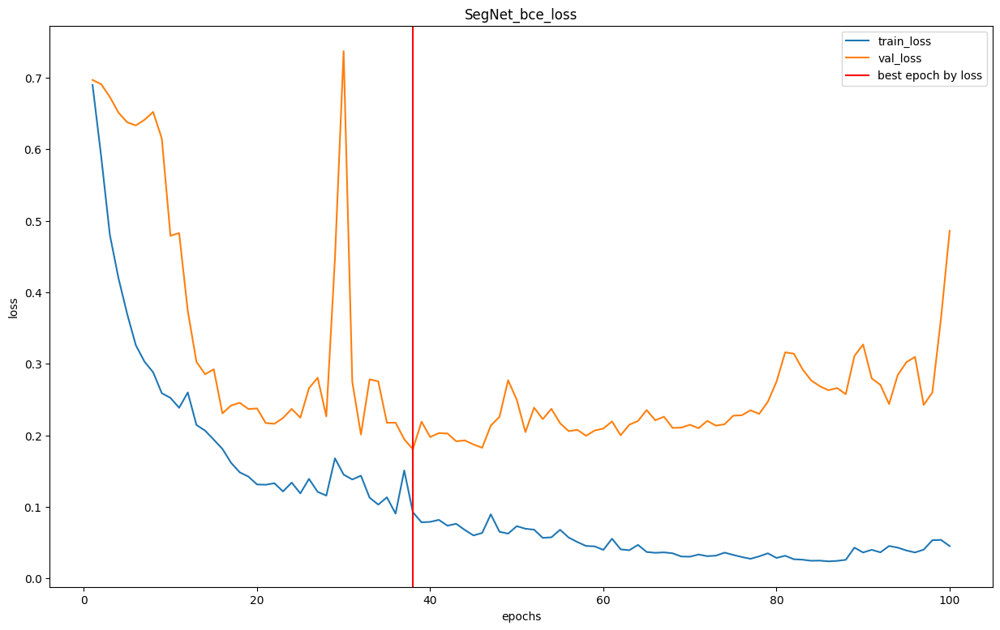

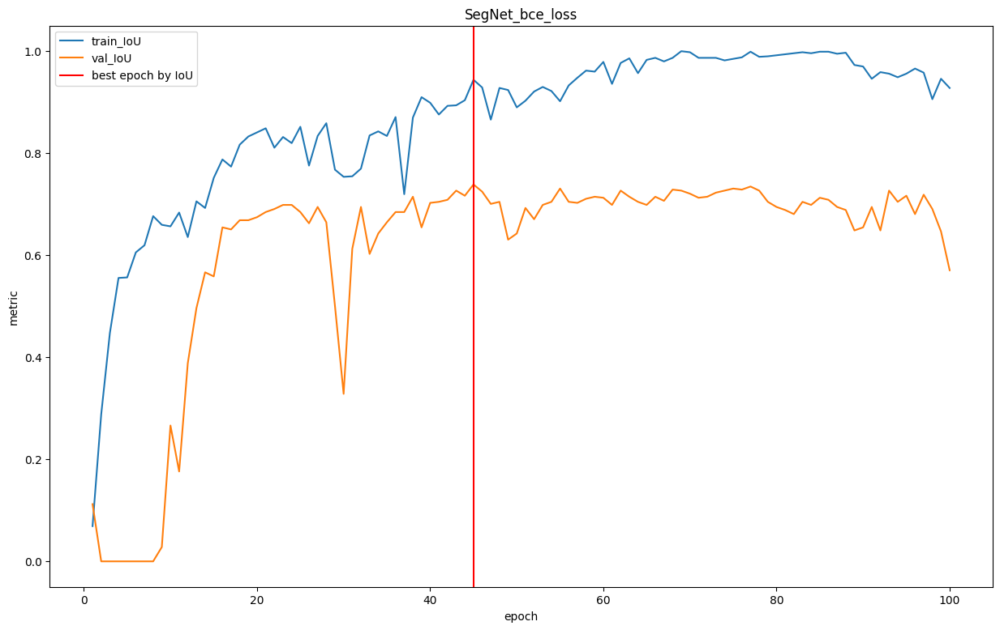

SegNet_bce_loss: best IoU value 0.7380000352859497 on 45 epoch.


In [24]:


torch.cuda.empty_cache()

net = SegNet().to(device)
model_name = "SegNet_bce_loss"
criterion = bce_loss
epochs = 100
user_metric_func = iou_pytorch
user_metric_name = 'IoU'
optimizer = torch.optim.Adam(net.parameters(), lr=1e-4)


train_loss, train_metrics, val_loss, val_metrics = train_model(
    net, data_tr, data_val, criterion, optimizer, epochs, device,
    model_output_to_predict=one_class_get_labels,
    metrics={user_metric_name: user_metric_func}, main_metric_name=user_metric_name, save_best=True, model_name=model_name)

show_plots(
    train_loss, train_metrics, val_loss, val_metrics,
    model_name=model_name)
print_best_epoch(
    val_metrics[user_metric_name], metric_name=user_metric_name,
    model_name=model_name)


Ответьте себе на вопрос: не переобучается ли моя модель?

По графикам видно, что после лучшей эпохи модель начала переобучаться.


-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла]

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss.
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


In [25]:
def dice_loss(logits, y_real, eps=1e-8):
    y_pred = torch.sigmoid(logits)
    num = (2 * y_pred * y_real).sum((-2, -1))
    den =  (y_pred + y_real).sum((-2, -1))
    res = 1 - ((num + eps) / (den + eps)).mean()
    return res

Проводим тестирование:

epochs:   0%|          | 0/100 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

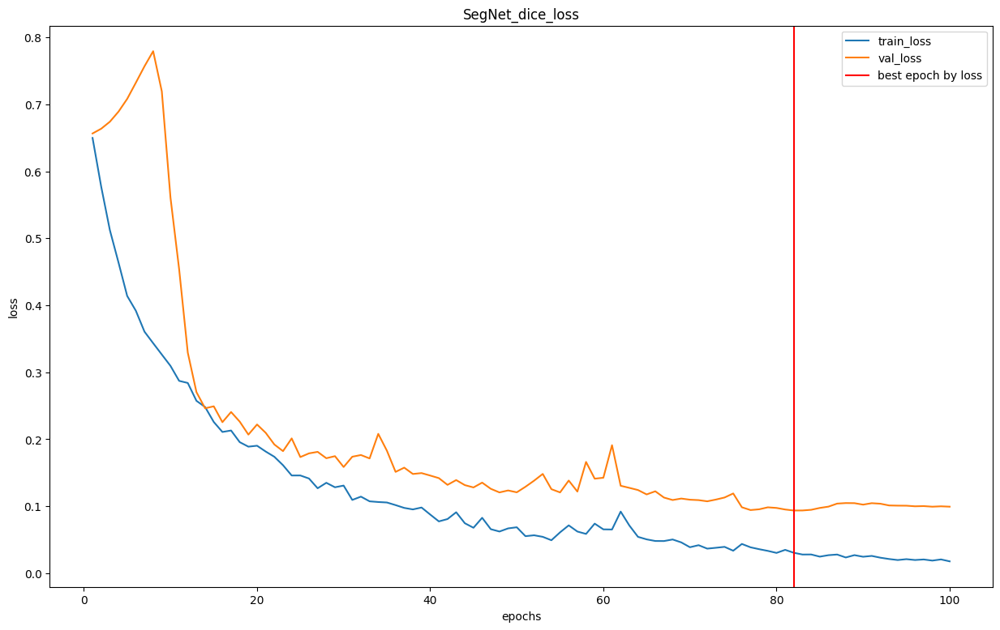

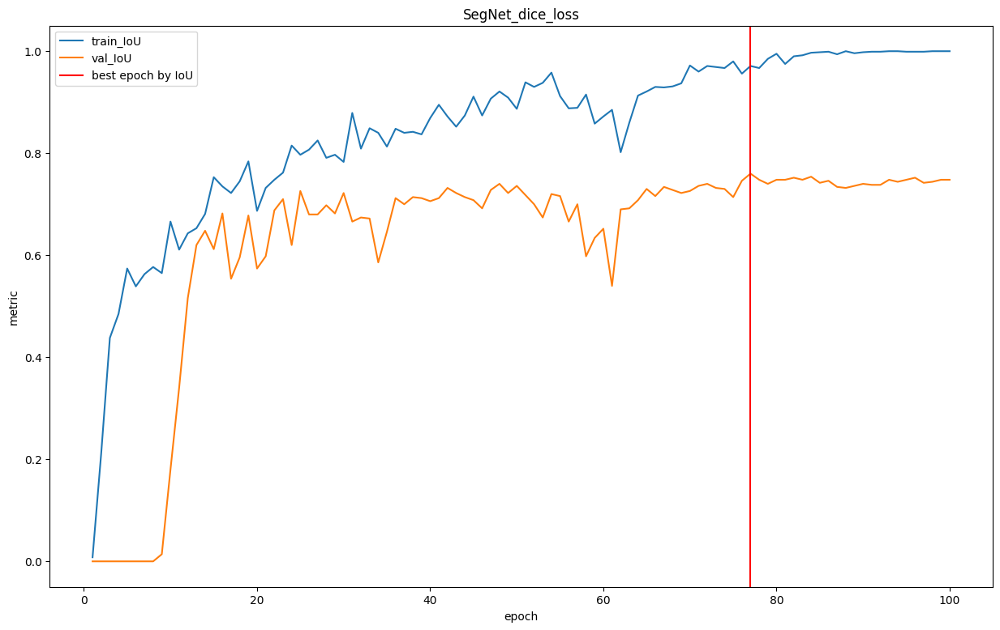

SegNet_dice_loss: best IoU value 0.7599999904632568 on 77 epoch.


In [26]:

torch.cuda.empty_cache()

net = SegNet().to(device)
model_name = "SegNet_dice_loss"
criterion = dice_loss
epochs = 100
user_metric_func = iou_pytorch
user_metric_name = 'IoU'
optimizer = torch.optim.Adam(net.parameters(), lr=1e-4)


train_loss, train_metrics, val_loss, val_metrics = train_model(
    net, data_tr, data_val, criterion, optimizer, epochs, device,
    model_output_to_predict=one_class_get_labels,
    metrics={user_metric_name: user_metric_func}, main_metric_name=user_metric_name, save_best=True, model_name=model_name)

show_plots(
    train_loss, train_metrics, val_loss, val_metrics,
    model_name=model_name)
print_best_epoch(
    val_metrics[user_metric_name], metric_name=user_metric_name,
    model_name=model_name)


[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [27]:
def focal_loss(y_pred, y_real, eps=1e-8, gamma=2):
    pos_cls_freq = y_real.sum() / y_real.numel()
    alpha = y_real * (1 - pos_cls_freq) + (1 - y_real) * pos_cls_freq
    probs = torch.sigmoid(y_pred)
    pt = y_real * probs + (1 - y_real) * (1 - probs)
    weight = torch.pow(1 - pt, gamma)
    bce = y_real * y_pred - y_pred - torch.log(1 + torch.exp(-y_pred))
    your_loss = -(alpha * weight * bce).mean()
    return your_loss

epochs:   0%|          | 0/100 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

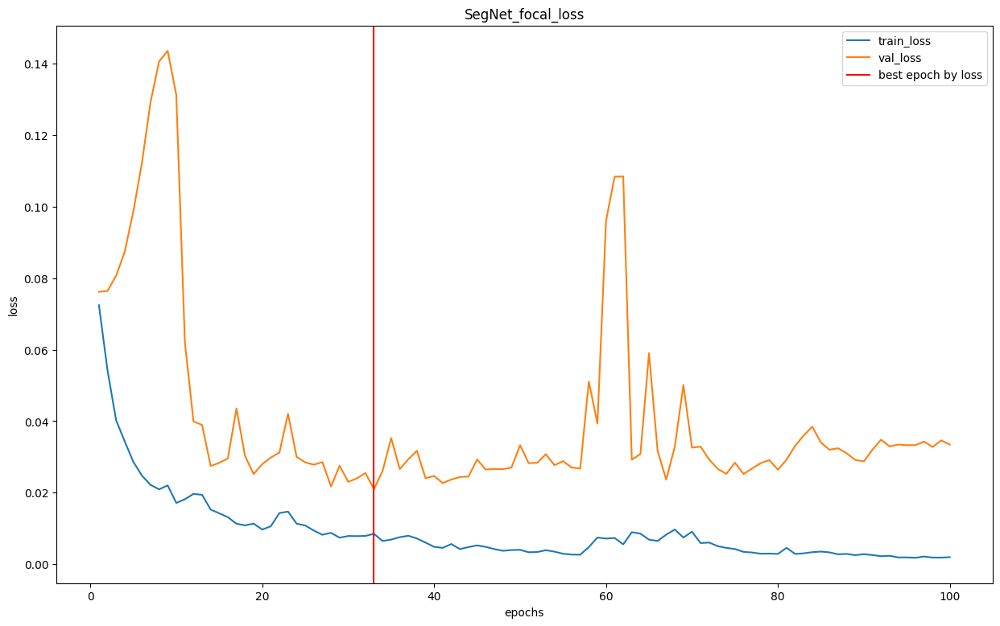

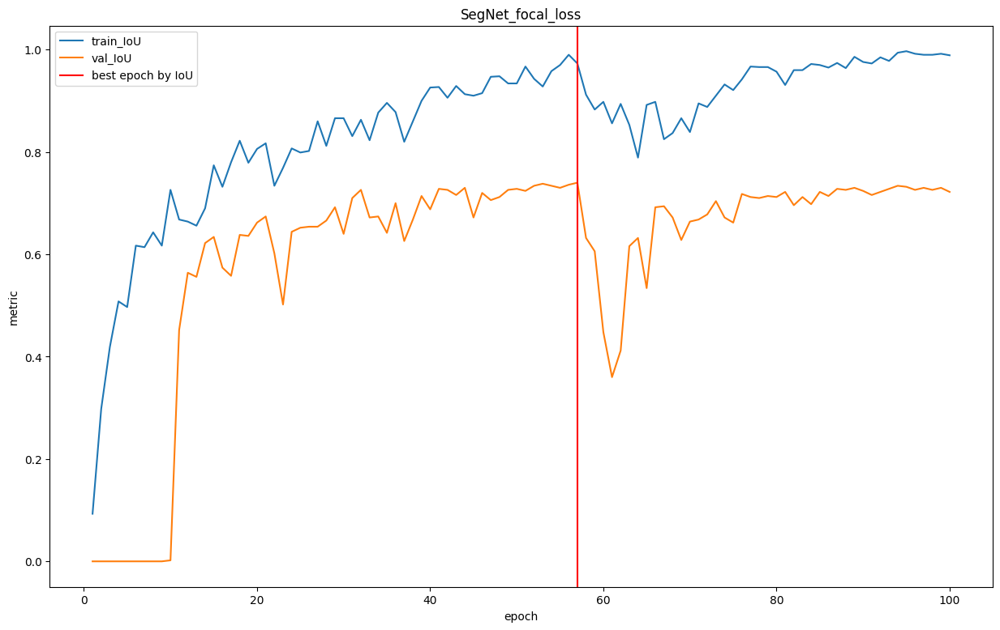

SegNet_focal_loss: best IoU value 0.7400000095367432 on 57 epoch.


In [28]:
torch.cuda.empty_cache()

net = SegNet().to(device)
model_name = "SegNet_focal_loss"
criterion = focal_loss
epochs = 100
user_metric_func = iou_pytorch
user_metric_name = 'IoU'

optimizer = torch.optim.Adam(net.parameters(), lr=1e-4)

train_loss, train_metrics, val_loss, val_metrics = train_model(
    net, data_tr, data_val, criterion, optimizer, epochs, device,
    model_output_to_predict=one_class_get_labels,
    metrics={user_metric_name: user_metric_func}, main_metric_name=user_metric_name, save_best=True, model_name=model_name)

show_plots(
    train_loss, train_metrics, val_loss, val_metrics,
    model_name=model_name)
print_best_epoch(
    val_metrics[user_metric_name], metric_name=user_metric_name,
    model_name=model_name)


----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты?

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

In [ ]:
<TODO>

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

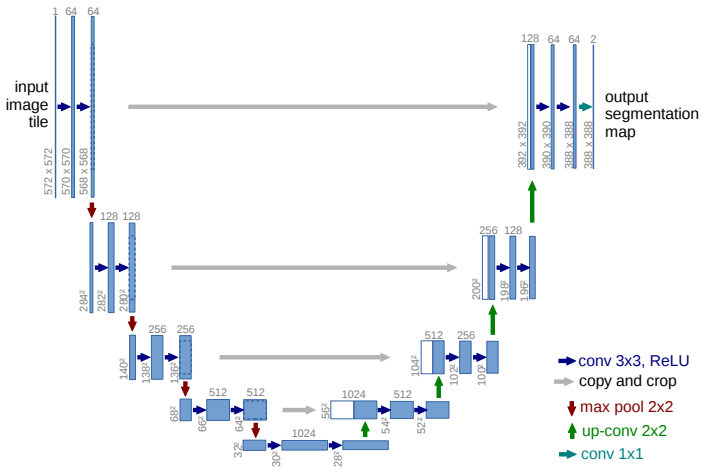

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [29]:
from torchvision.transforms.functional import center_crop

class UNet(nn.Module):
    def __init__(self, padding=1):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2)  # as in the original paper
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=1024, out_channels=1024, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )

        # decoder (upsampling)
        self.upsample0 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, padding=padding),
        )
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.upsample1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=padding),
        )
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.upsample2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=padding),
        )
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.upsample3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=padding),
        )
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        pooled = self.pool0(e0)
        e1 = self.enc_conv1(pooled)
        pooled = self.pool1(e1)
        e2 = self.enc_conv2(pooled)
        pooled = self.pool2(e2)
        e3 = self.enc_conv3(pooled)
        pooled = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(pooled)

        # decoder
        upsampled = self.upsample0(b)
        e3_cropped = center_crop(e3, upsampled.shape[-2:])
        concatenated = torch.cat((e3_cropped, upsampled), dim=1)
        d0 = self.dec_conv0(concatenated)
        upsampled = self.upsample1(d0)
        e2_cropped = center_crop(e2, upsampled.shape[-2:])
        concatenated = torch.cat((e2_cropped, upsampled), dim=1)
        d1 = self.dec_conv1(concatenated)
        upsampled = self.upsample2(d1)
        e1_cropped = center_crop(e1, upsampled.shape[-2:])
        concatenated = torch.cat((e1_cropped, upsampled), dim=1)
        d2 = self.dec_conv2(concatenated)
        upsampled = self.upsample3(d2)
        e0_cropped = center_crop(e0, upsampled.shape[-2:])
        concatenated = torch.cat((e0_cropped, upsampled), dim=1)
        d3 = self.dec_conv3(concatenated)
        return d3

epochs:   0%|          | 0/100 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

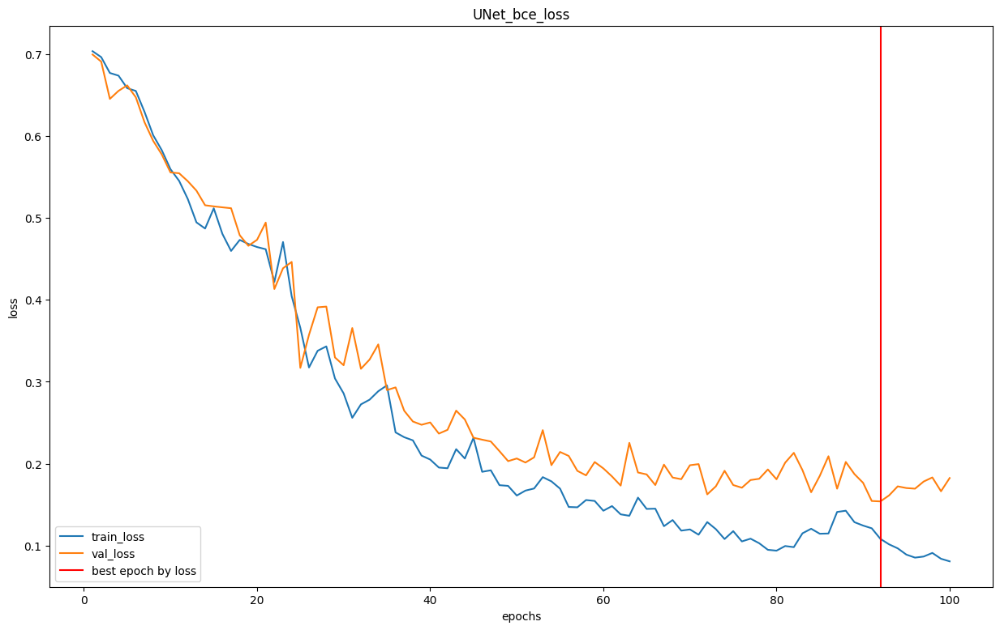

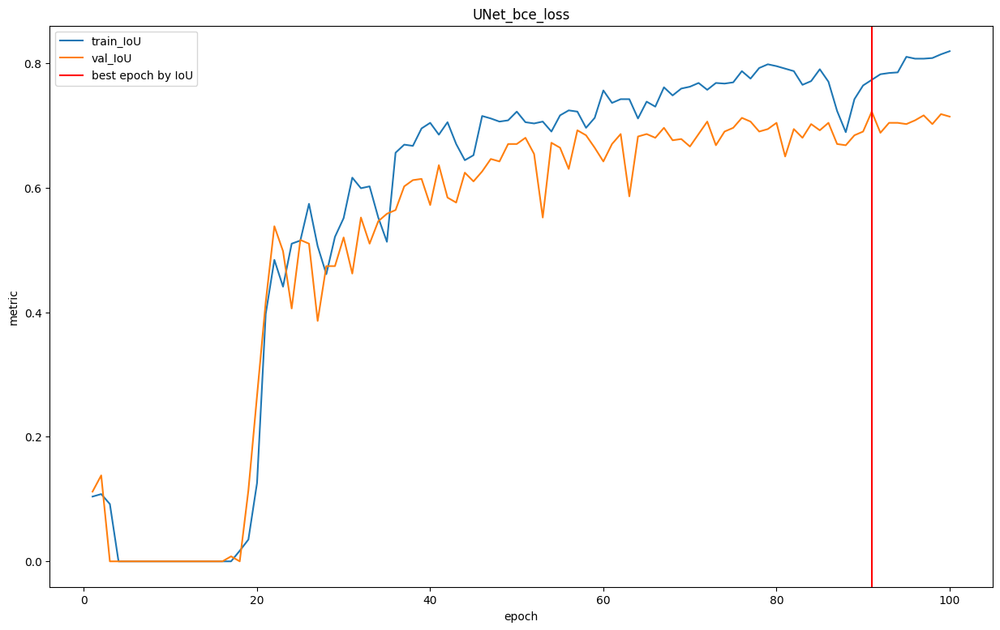

UNet_bce_loss: best IoU value 0.722000002861023 on 91 epoch.


In [30]:
torch.cuda.empty_cache()

net = UNet().to(device)
model_name = "UNet_bce_loss"
criterion = bce_loss
epochs = 100
user_metric_func = iou_pytorch
user_metric_name = 'IoU'
optimizer = torch.optim.Adam(net.parameters(), lr=1e-4)

train_loss, train_metrics, val_loss, val_metrics = train_model(
    net, data_tr, data_val, criterion, optimizer, epochs, device,
    model_output_to_predict=one_class_get_labels,
    metrics={user_metric_name: user_metric_func}, main_metric_name=user_metric_name, save_best=True, model_name=model_name)

show_plots(
    train_loss, train_metrics, val_loss, val_metrics,
    model_name=model_name)
print_best_epoch(
    val_metrics[user_metric_name], metric_name=user_metric_name,
    model_name=model_name)


Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [31]:
from torchvision.transforms.functional import center_crop

class unet2(nn.Module):
    def __init__(self, padding=1):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool0 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=2, stride=2)
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=2, stride=2)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=2, stride=2)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=2, stride=2)

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=1024, out_channels=1024, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=2, stride=2)
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.upsample1 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=2, stride=2)
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.upsample2 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2)
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True)
        )
        self.upsample3 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2)
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=padding),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        pooled = self.pool0(e0)
        e1 = self.enc_conv1(pooled)
        pooled = self.pool1(e1)
        e2 = self.enc_conv2(pooled)
        pooled = self.pool2(e2)
        e3 = self.enc_conv3(pooled)
        pooled = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(pooled)

        # decoder
        upsampled = self.upsample0(b)
        e3_cropped = center_crop(e3, upsampled.shape[-2:])
        concatenated = torch.cat((e3_cropped, upsampled), dim=1)
        d0 = self.dec_conv0(concatenated)
        upsampled = self.upsample1(d0)
        e2_cropped = center_crop(e2, upsampled.shape[-2:])
        concatenated = torch.cat((e2_cropped, upsampled), dim=1)
        d1 = self.dec_conv1(concatenated)
        upsampled = self.upsample2(d1)
        e1_cropped = center_crop(e1, upsampled.shape[-2:])
        concatenated = torch.cat((e1_cropped, upsampled), dim=1)
        d2 = self.dec_conv2(concatenated)
        upsampled = self.upsample3(d2)
        e0_cropped = center_crop(e0, upsampled.shape[-2:])
        concatenated = torch.cat((e0_cropped, upsampled), dim=1)
        d3 = self.dec_conv3(concatenated)  # no activation
        return d3


epochs:   0%|          | 0/100 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

train batches:   0%|          | 0/4 [00:00<?, ?it/s]

val batches:   0%|          | 0/2 [00:00<?, ?it/s]

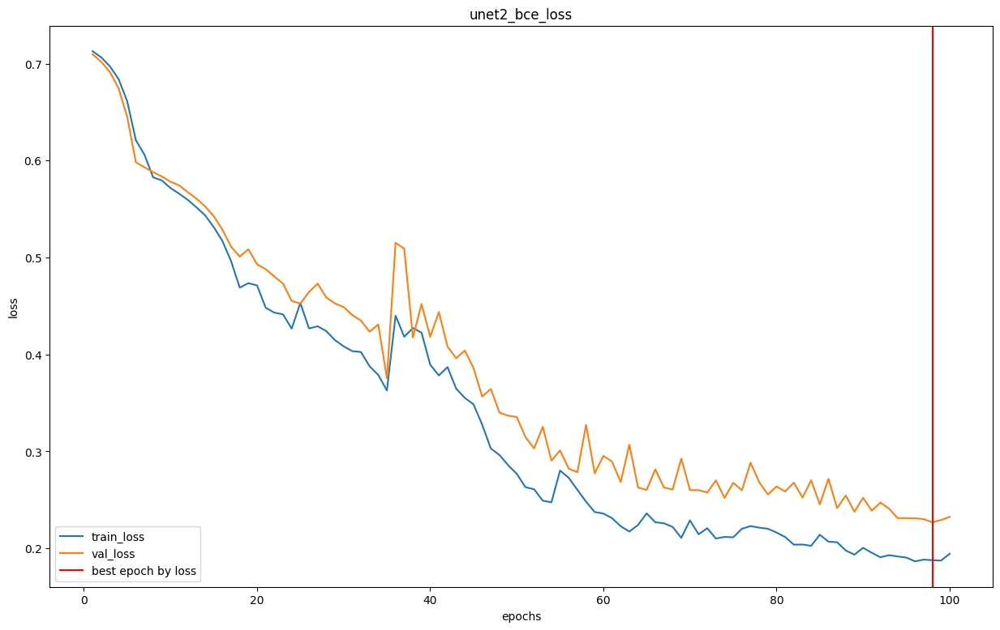

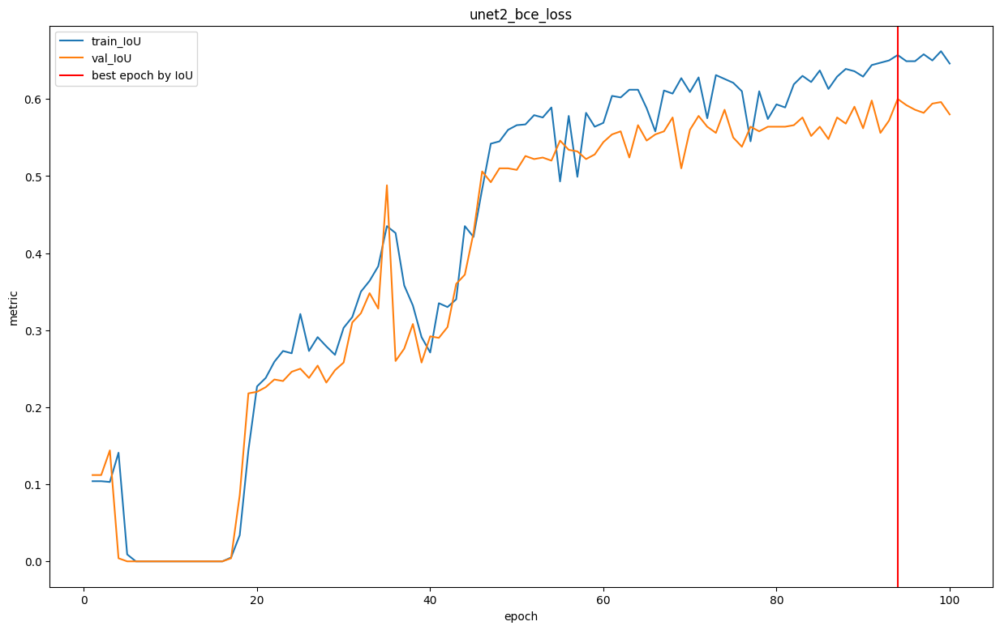

unet2_bce_loss: best IoU value 0.5999999642372131 on 94 epoch.


In [32]:
torch.cuda.empty_cache()

net = unet2().to(device)
model_name = "unet2_bce_loss"
criterion = bce_loss
epochs = 100
user_metric_func = iou_pytorch
user_metric_name = 'IoU'
optimizer = torch.optim.Adam(net.parameters(), lr=1e-4)

train_loss, train_metrics, val_loss, val_metrics = train_model(
    net, data_tr, data_val, criterion, optimizer, epochs, device,
    model_output_to_predict=one_class_get_labels,
    metrics={user_metric_name: user_metric_func}, main_metric_name=user_metric_name, save_best=True, model_name=model_name)

show_plots(
    train_loss, train_metrics, val_loss, val_metrics,
    model_name=model_name)
print_best_epoch(
    val_metrics[user_metric_name], metric_name=user_metric_name,
    model_name=model_name)


Сделайте вывод, какая из моделей лучше

# Отчет (6 баллов):
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте.
Если вы пропустили какую-то часть в задании выше, то вы все равно можете получить основную часть баллов в отчете, если правильно зададите проверяемые вами гипотезы.


Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверяющий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.

Дополнительные комментарии:

Пусть у вас есть N обученных моделей.
- Является ли отчетом N графиков с 1 линей? Да, но очень низкокачественным, потому что проверяющий не сможет сам сравнить их.

- Является ли отчетом 1 график с N линиями? Да, но скорее всего таким образом вы отразили лишь один эффект. Этого мало, чтобы сделать досточно суждений по поводу вашей работа.

- Я проверял метрики на трейне, и привел в результате таблицу с N числами, что не так? ключейвой момент тут, что вы измеряли на трейне ваши метрики, уверены ли вы, что заивисмости останутся такими же на отложенной выборке?

- Я сделал отчет содержащий график лоссов и метрик, и у меня нет ошибок в основной части, но за отчет не стоит максимум, почему? Естестественно максимум баллов за отчет можно получить не за 2 графика (даже при условии их полной правильности). Проверяющий хочет видеть больше сравнений моделей, чем метрики и лоссы (особенно, если они на трейне).

Советы: попробуйте правильно поставить вопрос на который вы себе отвечаете и продемонстрировать таблицу/график, помогающий проверяющему увидеть ответ на этот вопрос. Пример: Ваня хочет узнать, с каким из 4-х лоссов модель (например, U-Net) имеет наилучшее качество. Что нужно сделать Ване? Обучить 4 одинаковых модели с разными лосс функциями. И измерить итогововое качество. Продемонстрировать результаты своих измерений и итоговый вывод. (warning: конечно же, это не идеально ответит на наш вопрос, так как мы не учитываем в экспериментах возможные различные типы ошибок, но для первого приближения этого вполне достаточно).

Примерное время на подготовку отчета 1 час, он содержит сравнеение метрик, график лоссов, выбор лучших моделей из нескольких кластеров и выбор просто лучшей модели, небольшой вывод по всему дз, возможно сравнение результирующих сегментаций, времени или числа параметров модели, проявляйте креативность.

model_loss;         best epoch;   val loss;   val IoU;  test IoU

SegNet_dice_loss       45         0.18734    0.738     0.783

SegNet_dice_loss       77         0.089511    0.759     0.769

SegNet_focal_loss      54        0.240132    0.740     0.785

UNet_bce_loss          91       0.162166    0.722     0.714

UNet2_bce_loss         94       0.235033    0.599     0.606

Лучшее занчение метрики на тестовой выборке показала SegNet_focal_loss. UNet и UNet2 с bce loss показали худшие метрики. После каждого раздела идут два графика с зависимостью метрики и loss от эпох.